<a href="https://colab.research.google.com/github/tapanyemre/network-analysis/blob/main/Simulating_How_News_Spreads_04_25_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Simulation of News Diffusion Processes in the Print, Broadcast, and Internet Ages**

## **Part 1. Generate Network Graphs**

by Hong Qu

**Graph models:**
1.   Lattice
2.   Star
3.   Random
4.   Small World
5.   Scale Free

In [ ]:
import networkx as nx
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt

## **Generating different types of network models:**

###Initialize Networks

In [ ]:
n = 100
p_small_world_rewire = .2
p_random_link = .03
p_rewire=.6
m_scale_free = 8

In [ ]:

G_lattice = nx.grid_2d_graph(10, 10, periodic=True)
G_star = nx.star_graph(50-1)
G_small_world = nx.watts_strogatz_graph(n, 4, p_rewire, seed=None)
G_random = nx.erdos_renyi_graph(n, p_random_link, seed=None, directed=False)
G_scale_free = nx.barabasi_albert_graph(n, m_scale_free)

### Plot network visualizations

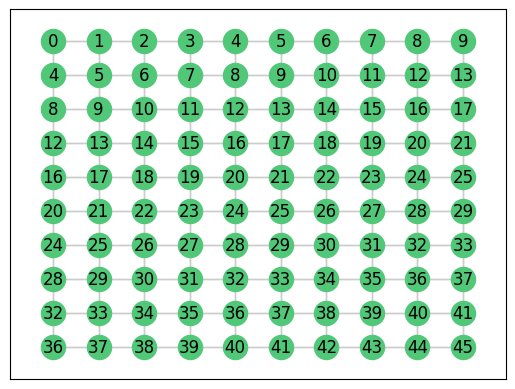

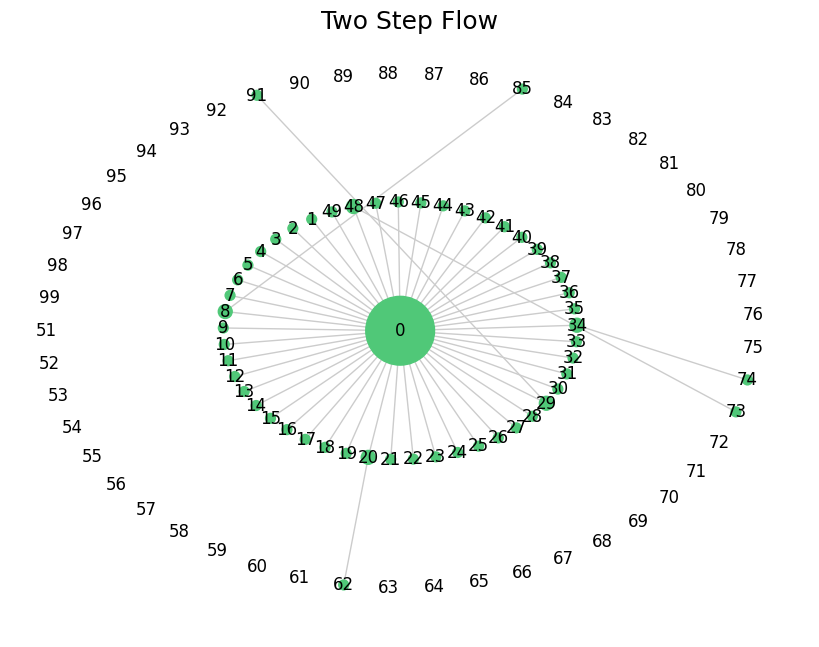

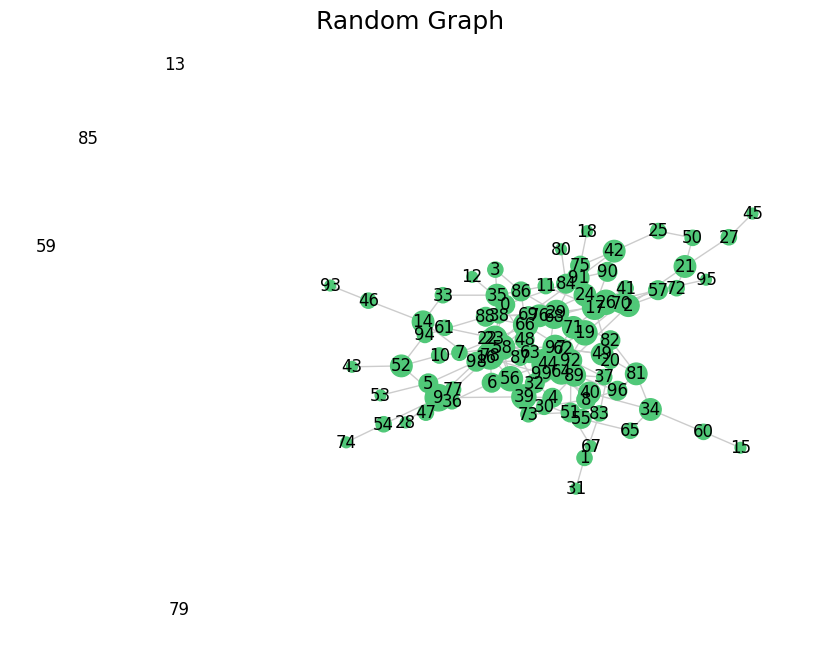

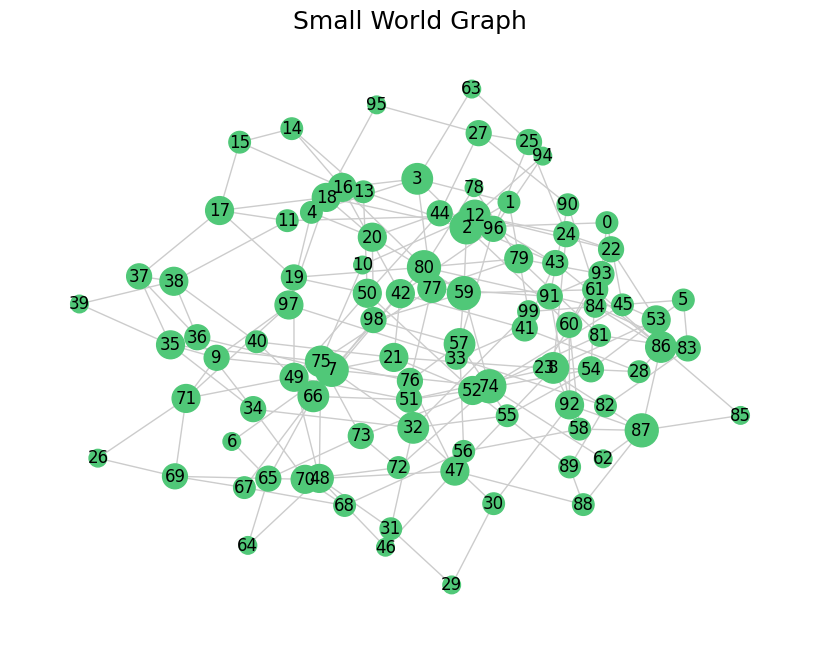

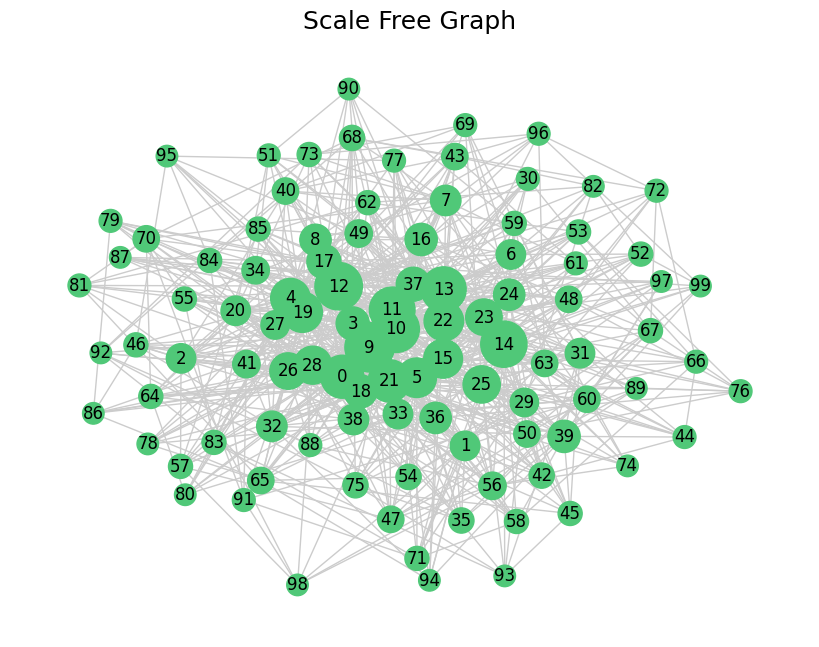

In [ ]:
shells=[]
shells_chain=[]


pos = dict((n, n) for n in G_lattice.nodes())
labels = dict(((i, j), i + (10-1-j) * 4 ) for i, j in G_lattice.nodes())
nx.draw_networkx(G_lattice, edge_color='#CCCCCC', node_color='#50C878', pos=pos, labels=labels)
#plt.axis('off')
plt.show()

for i in range(51,100):
    G_star.add_node(i)
for i in range(0,5):
    G_star.add_edge(random.randrange(2, 49), random.randrange(51, 99))
plt.figure(figsize=(8, 6))
degree_dist_star = dict(G_star.degree)
shells = [[0], list(range(1,50)),list(range(51,100))]
nx.draw(G_star, pos=nx.shell_layout(G_star, shells), edge_color='#CCCCCC', node_size=[v * 50 for v in degree_dist_star.values()], node_color='#50C878', with_labels = True)
plt.title('Two Step Flow', size=18)
plt.show()

degree_dist_random = dict(G_random.degree)
plt.figure(figsize=(8, 6))
nx.draw(G_random, edge_color='#CCCCCC', node_size=[v * 60 for v in degree_dist_random.values()], node_color='#50C878', with_labels = True)
plt.title('Random Graph', size=18)
plt.show()

plt.figure(figsize=(8, 6))
degree_dist_small_world = dict(G_small_world.degree)
nx.draw(G_small_world, edge_color='#CCCCCC', node_size=[v * 80 for v in degree_dist_small_world.values()], node_color='#50C878', with_labels = True)
plt.title('Small World Graph', size=18)
plt.show()

degree_dist_scale_free = dict(G_scale_free.degree)
plt.figure(figsize=(8, 6))
nx.draw(G_scale_free, edge_color='#CCCCCC', node_size=[v * 30 for v in degree_dist_scale_free.values()], node_color='#50C878', with_labels = True)
plt.title('Scale Free Graph', size=18)
plt.show()



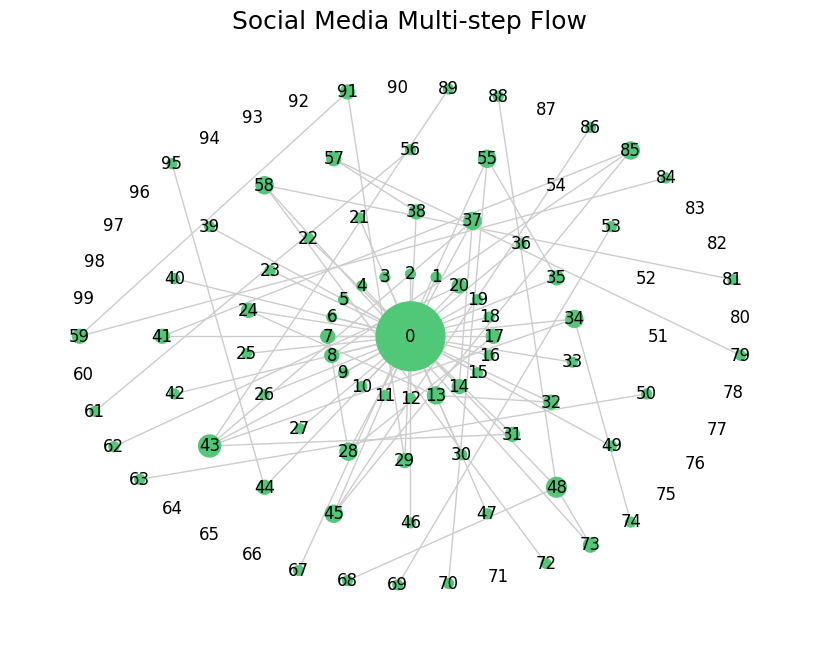

In [ ]:
for i in range(0,5):
    G_star.add_edge(random.randrange(2, 20), random.randrange(21, 40))
for i in range(0,5):
    G_star.add_edge(random.randrange(21, 40), random.randrange(41, 59))
for i in range(0,18):
    G_star.add_edge(random.randrange(41, 60), random.randrange(60, 99))
plt.figure(figsize=(8, 6))
degree_dist_star = dict(G_star.degree)
shells_chain = [[0], list(range(1,21)),list(range(21,39)),list(range(39,59)),list(range(59,100))]
nx.draw(G_star, pos=nx.shell_layout(G_star, shells_chain), edge_color='#CCCCCC', node_size=[v * 50 for v in degree_dist_star.values()], node_color='#50C878', with_labels = True)
plt.title('Social Media Multi-step Flow', size=18)
plt.show()

## **Part 2. Simulation the Spread of a Virus**

In [ ]:
def init_conditions():
  #Set all nodes to be in state 0 susceptible
  state = 0
  nx.set_node_attributes(G, state, "state")
  #Set node(s) to be in state 1 infectious
  G.nodes[5]['state'] = 1 #

In [ ]:
def get_infected_nodes():
    infected_nodes = [x for x,y in G.nodes(data=True) if y['state']==1]
    return infected_nodes
def get_recovered_nodes():
    recovered_nodes = [x for x,y in G.nodes(data=True) if y['state']==2]
    return recovered_nodes
def get_susceptible_nodes():
    susceptible_nodes = [x for x,y in G.nodes(data=True) if y['state']==0]
    return susceptible_nodes

In [ ]:
def draw_network_graph(time):
  color_state_map = {2: '#788787', 0: '#50C878', 1: '#FF4D4D'}
  plt.figure(figsize=(10, 5))
  nx.draw(G, edge_color='#CCCCCC', node_size=[v * 30 for v in degree_dist.values()], node_color=[color_state_map[node[1]['state']] for node in G.nodes(data=True)], with_labels = True)
  plt.title('Nodes Status at Time = ' +str(time), size=18)
  plt.show()

def draw_network_graph_star(time):
  color_state_map = {2: '#788787', 0: '#50C878', 1: '#FF4D4D'}
  plt.figure(figsize=(10, 3))
  shells = [[0], list(range(1,50)),list(range(50,100))]
  nx.draw(G, pos=nx.shell_layout(G, shells), edge_color='#CCCCCC', node_size=[v * 80 for v in degree_dist.values()], node_color=[color_state_map[node[1]['state']] for node in G.nodes(data=True)], with_labels = True)
  plt.title('Nodes Status at Time = ' +str(time), size=18)
  plt.show()

In [ ]:
df_attrib= [] #list of panda dataframes to store health states in each time period
def spread_virus(star):
    infected_nodes_list = get_infected_nodes()
    t = 0
    infected_num_list = []
    recovered_num_list = []
    susceptible_num_list = []
    while(len(infected_nodes_list)>0):
        if star == 0:
            draw_network_graph(t)
        else:
           draw_network_graph_star(t)
        t=t+1
        infected_nodes_list = get_infected_nodes()
        num_infected = len(infected_nodes_list)
        recovered_nodes_list = get_recovered_nodes()
        num_recovered = len(recovered_nodes_list)
        susceptible_nodes_list = get_susceptible_nodes()
        num_susceptible = len(susceptible_nodes_list)
        infected_num_list.append(num_infected)
        recovered_num_list.append(num_recovered)
        susceptible_num_list.append(num_susceptible)
        for i in infected_nodes_list:
            neibs = list(G.neighbors(i))
            #print("node: "+str(i))
            for j in neibs:
                #print(j)
                if (G.nodes[j]['state']==0):
                    #print(j)
                    if (np.random.random() <= alpha):
                        #print("neib: "+str(j))
                        G.nodes[j]['state']=1
                        #print("state: "+ str(G.nodes[j]['state']))
            if (np.random.random() <= mu):
                G.nodes[i]['state']=2
        infected_nodes_list = get_infected_nodes()



        df_attrib.append(pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index'))
        #print(infected_nodes_list)
    infected_nodes_list = get_infected_nodes()
    num_infected = len(infected_nodes_list)
    recovered_nodes_list = get_recovered_nodes()
    num_recovered = len(recovered_nodes_list)
    susceptible_nodes_list = get_susceptible_nodes()
    num_susceptible = len(susceptible_nodes_list)
    infected_num_list.append(num_infected)
    recovered_num_list.append(num_recovered)
    susceptible_num_list.append(num_susceptible)
    return t, infected_num_list, recovered_num_list, susceptible_num_list

In [ ]:
G = nx.Graph()
G.clear()

In [ ]:
alpha = .8
mu = .3

In [ ]:
def print_stats():
    r0 = round(((alpha*avg_deg)/mu), 2)
    print("R0: ", r0)
    print("Peak cases: ", max(epi_curve_data))
    print("Peak time period: ", epi_curve_data.index(max(epi_curve_data)))
    print("Total time periods: ", num_periods)
    print("# of susceptible never infected: ", len(get_susceptible_nodes()))

In [ ]:
def generate_epidemic_graph():
  fig = plt.figure(figsize=(5, 4))
  ax = plt.axes()
  plt.xlabel('xlabel', fontsize=12)
  plt.ylabel('ylabel', fontsize=12)
  #ax.set_yscale('log')
  plt.stackplot(x,epi_curve_data, sup_curve_data, rec_curve_data, labels=['Infectious','Suspectible','Recovered'], colors=['#FF4D4D','#50C878','#788787'])
  ax.set(xlabel='Time', ylabel='Number of People')
  fig.suptitle('News Transmission Curve', fontsize=15)
  plt.legend()

## **Part 3: Run the simulation:**

In [ ]:
graph_types_list = [G_star,G_small_world,G_scale_free]

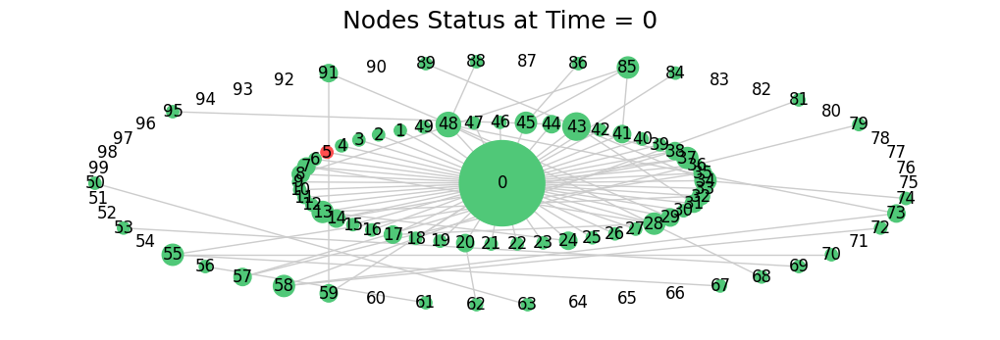

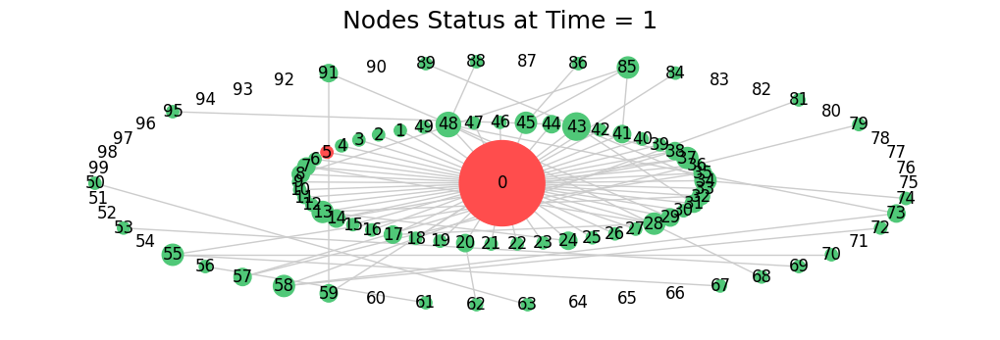

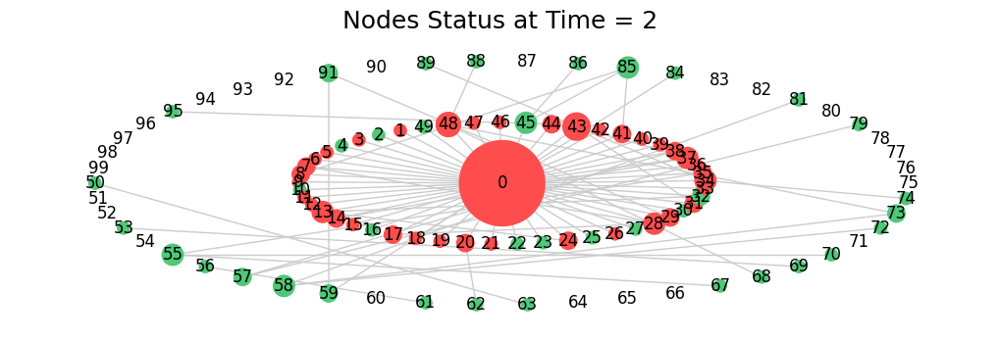

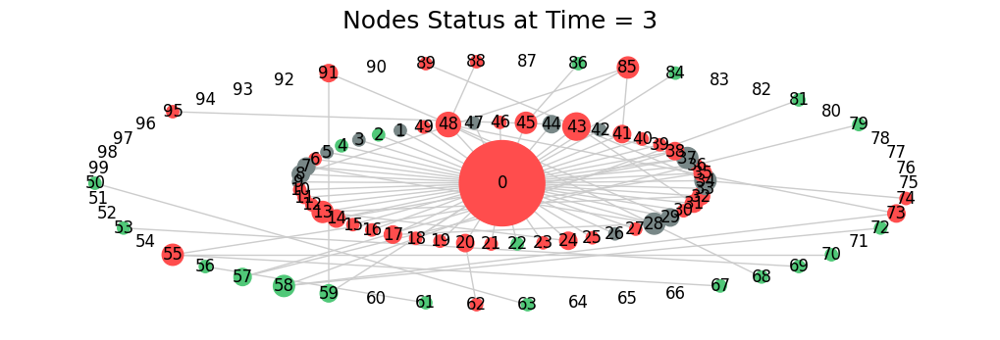

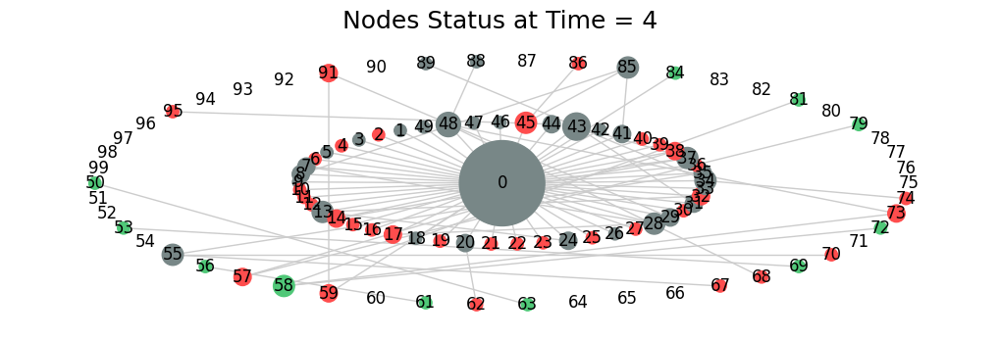

...

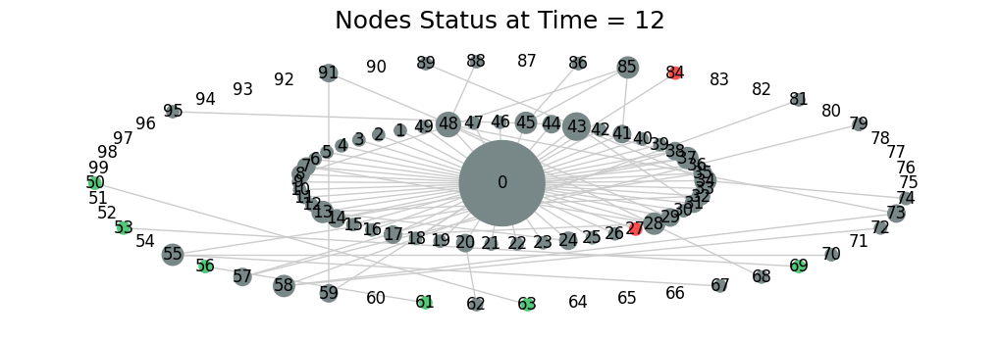

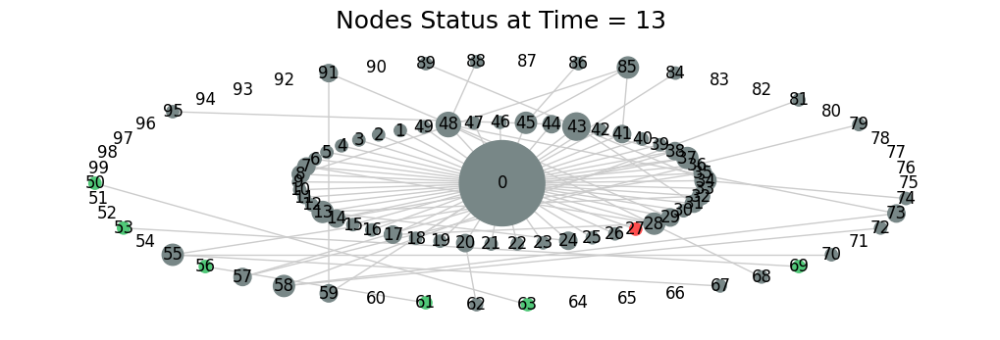

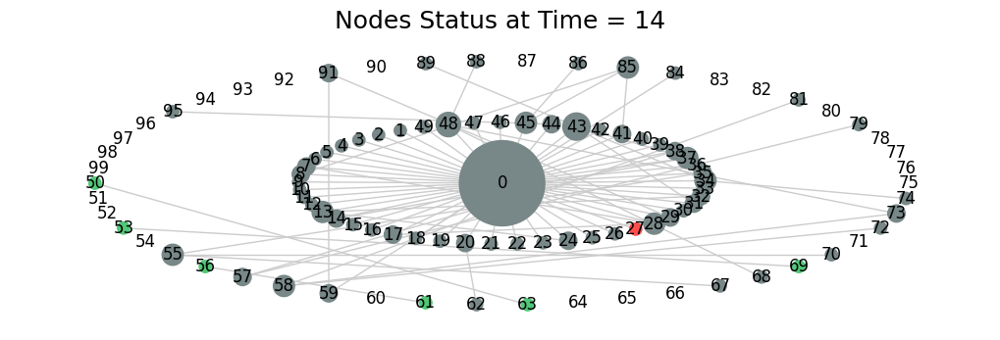

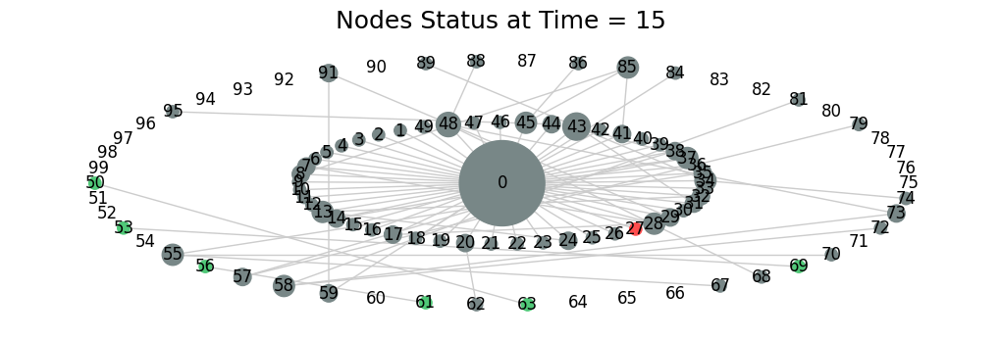

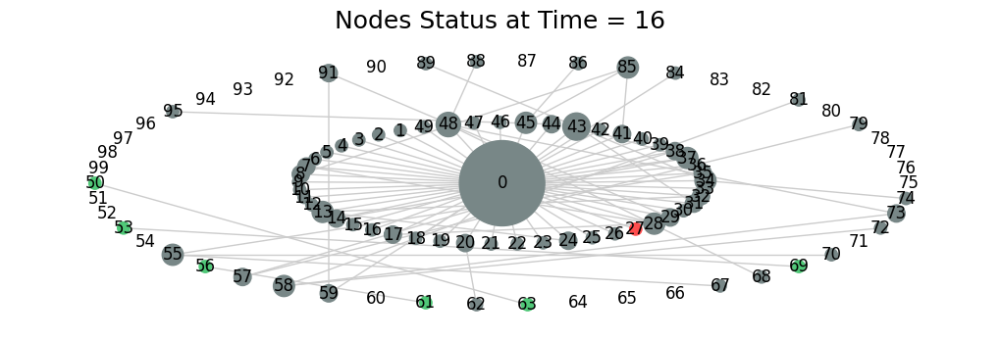

R0:  2.19
Peak cases:  41
Peak time period:  3
Total time periods:  17
# of susceptible never infected:  30


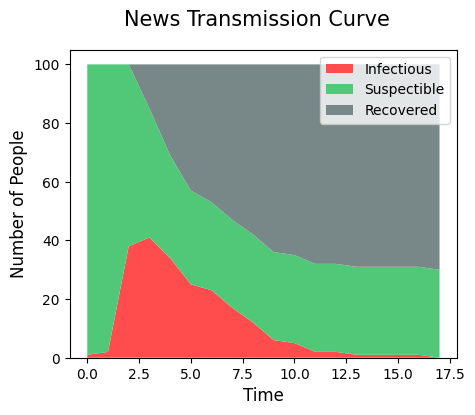

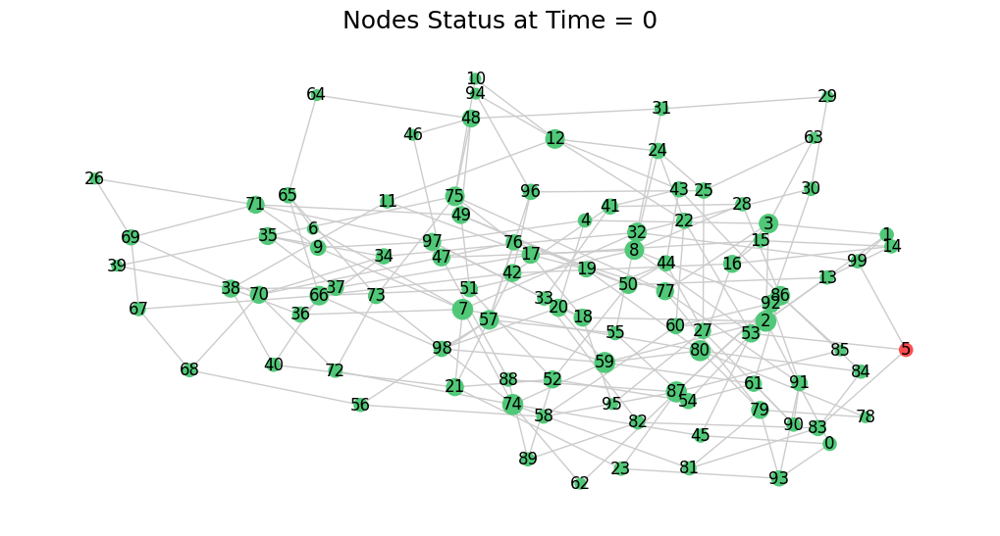

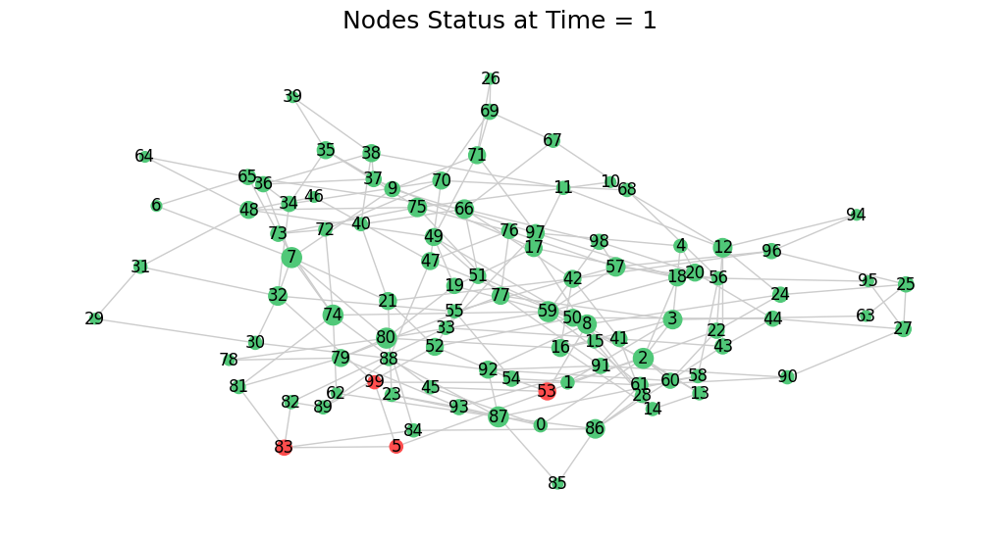

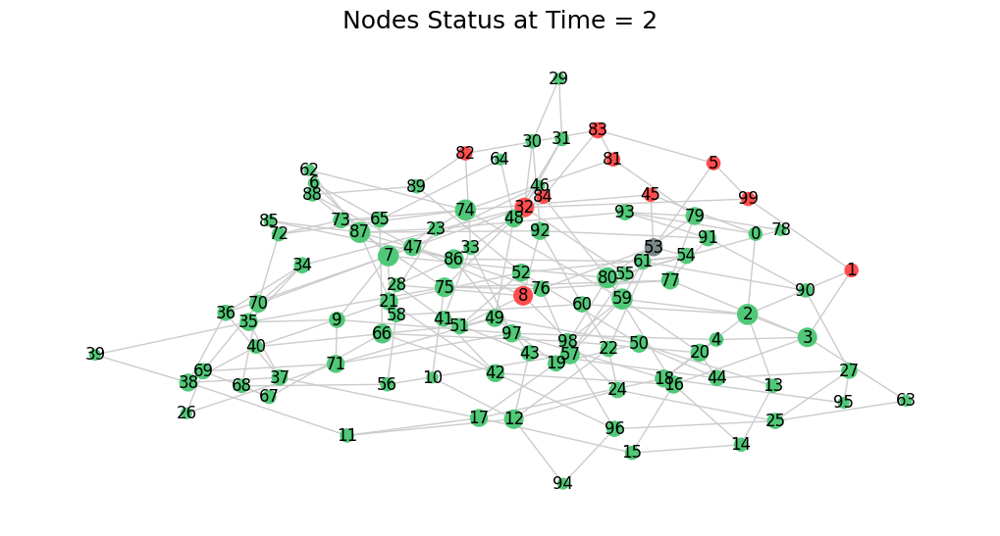

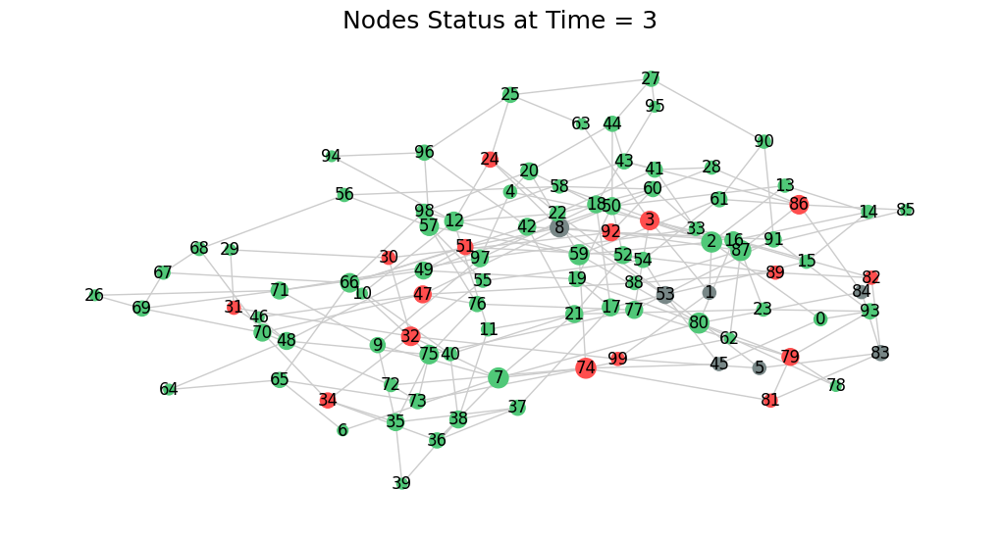

...

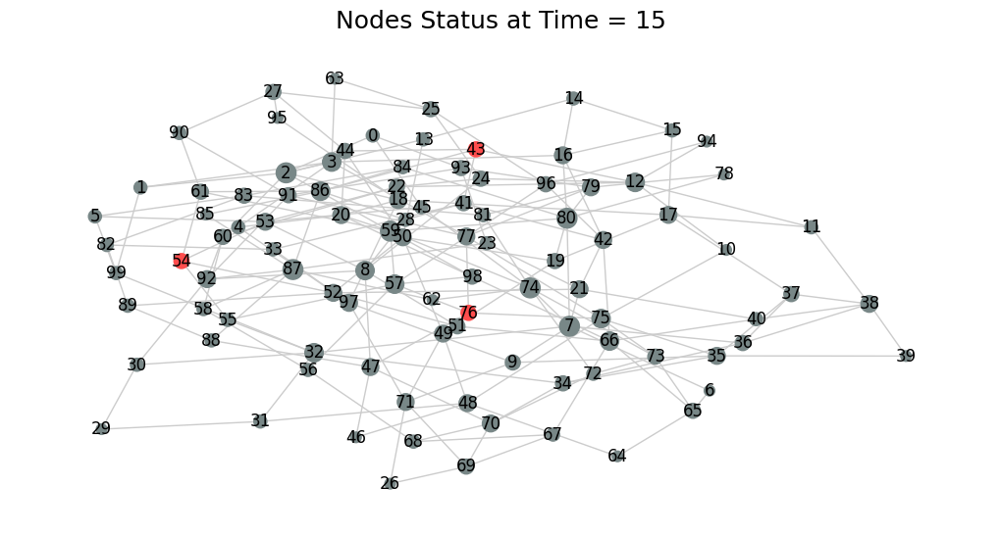

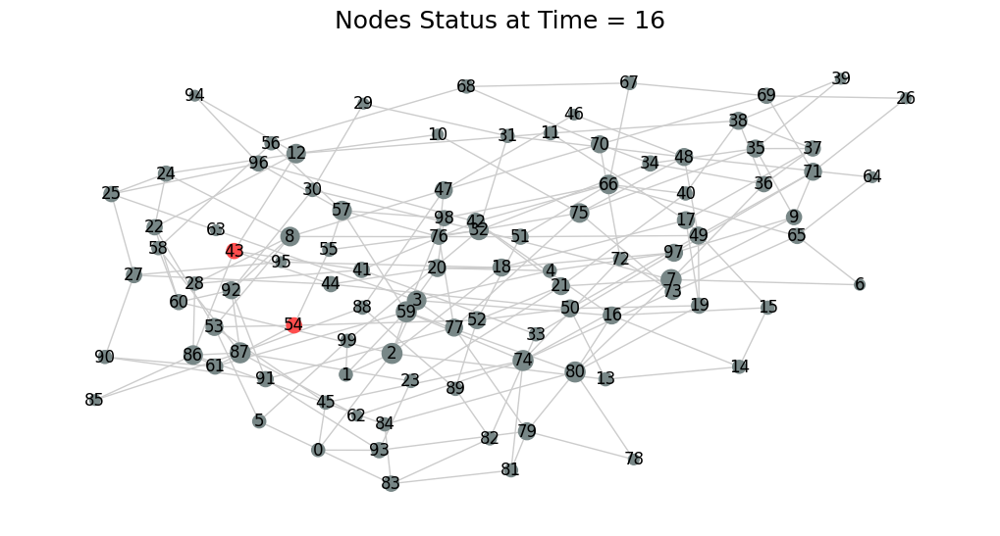

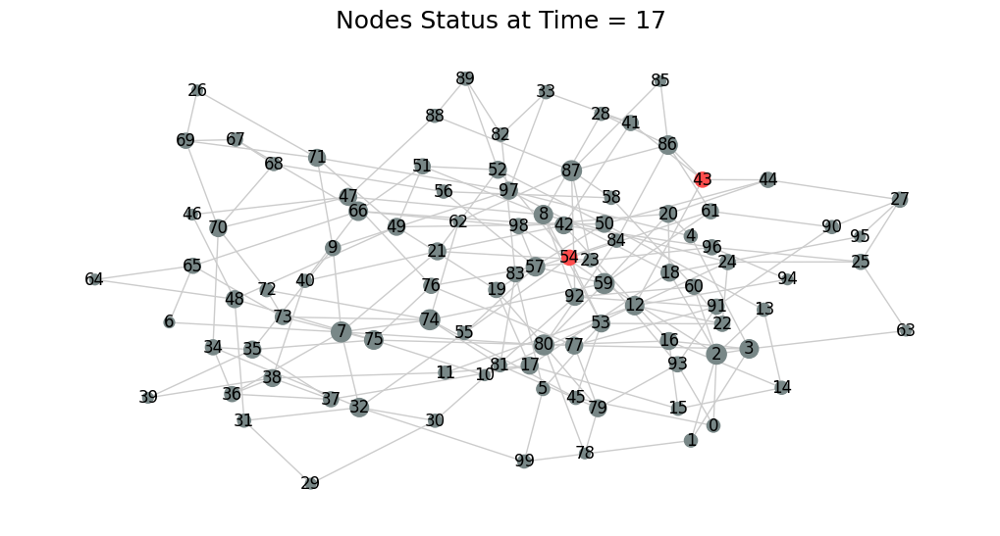

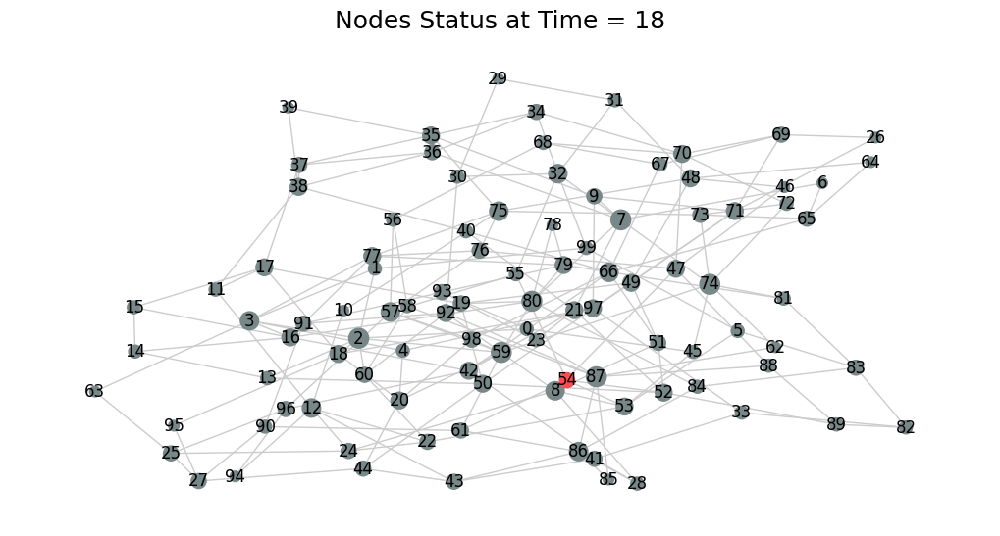

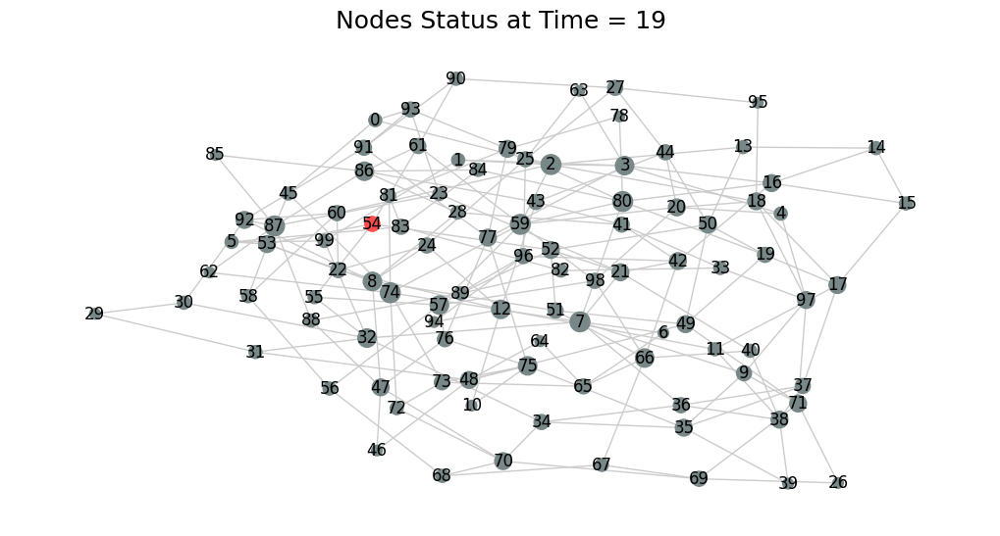

R0:  5.33
Peak cases:  71
Peak time period:  5
Total time periods:  20
# of susceptible never infected:  0


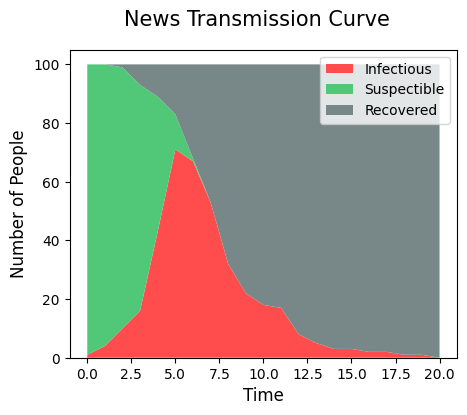

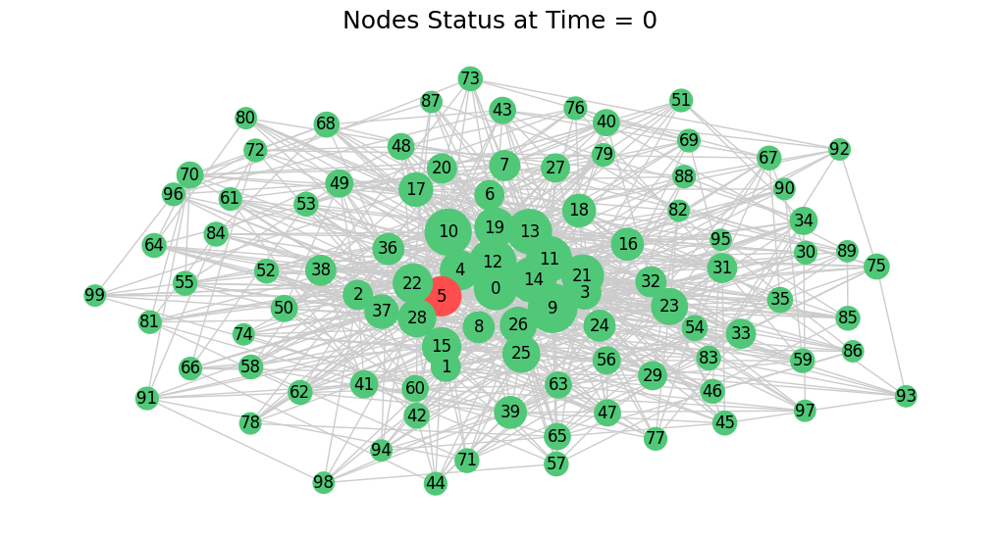

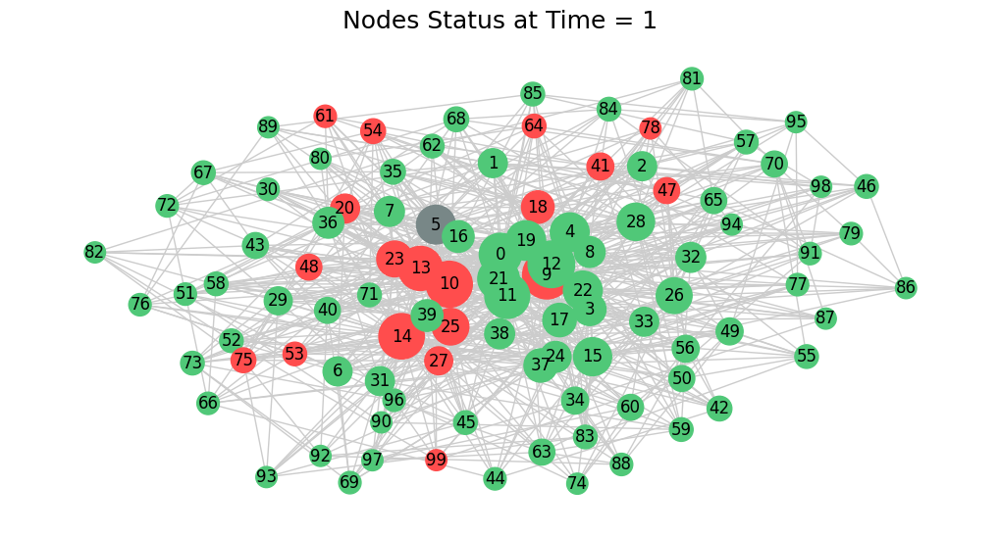

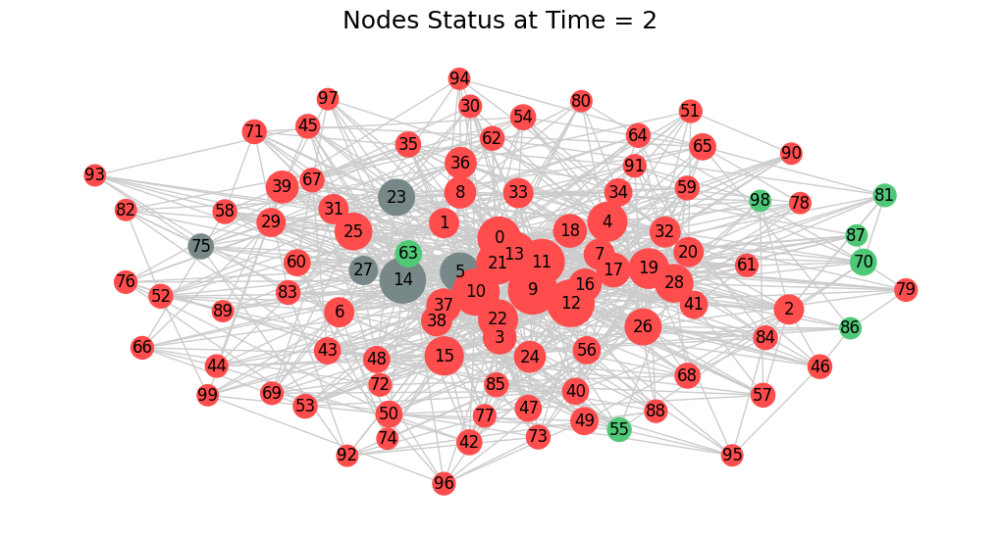

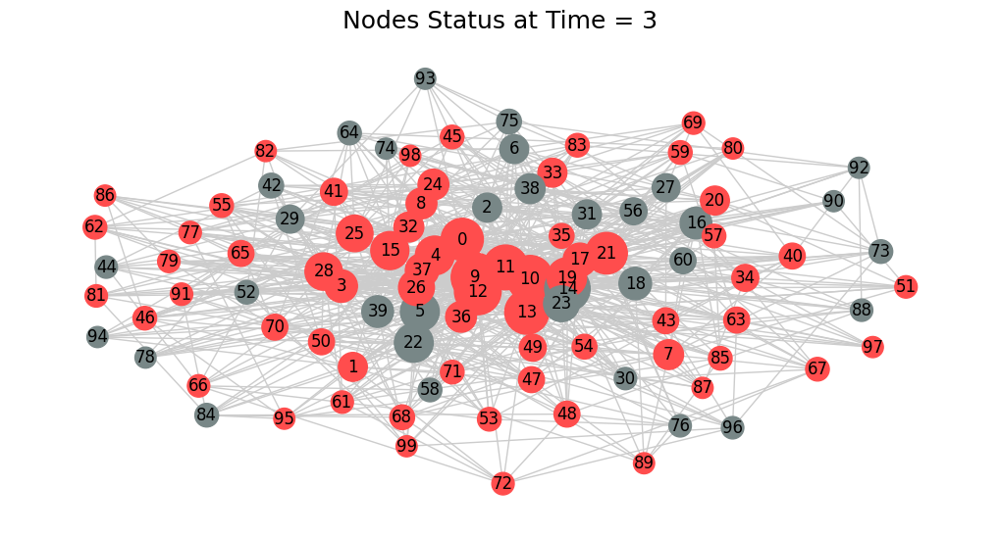

...

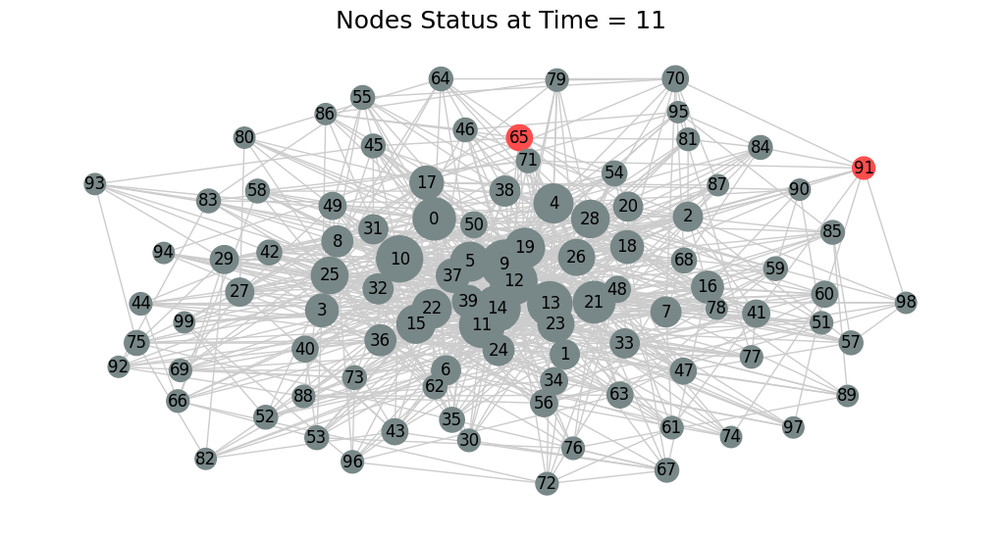

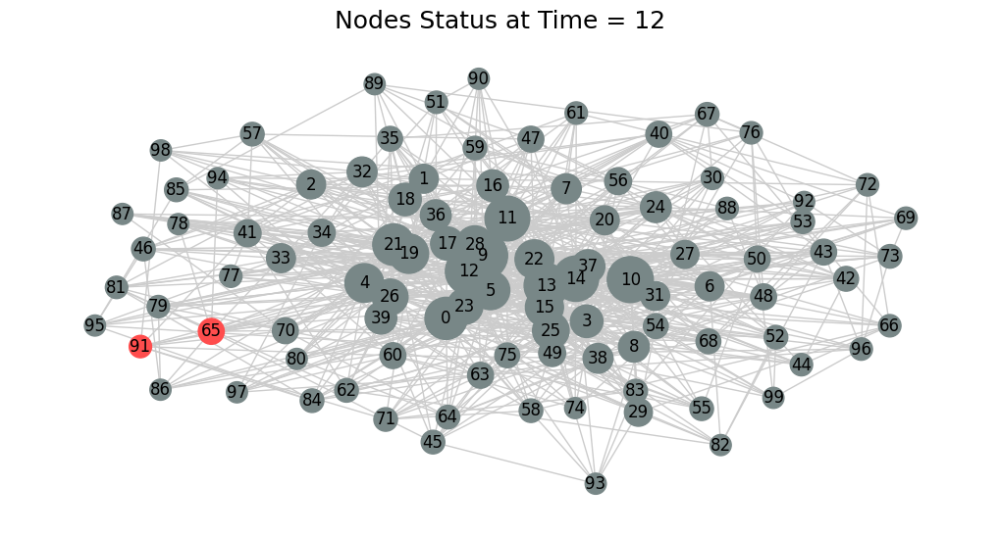

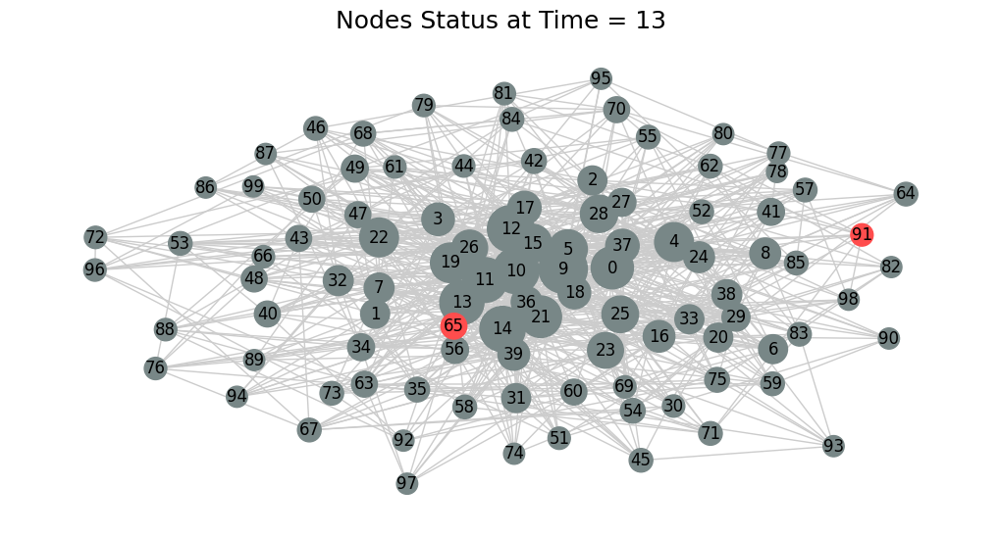

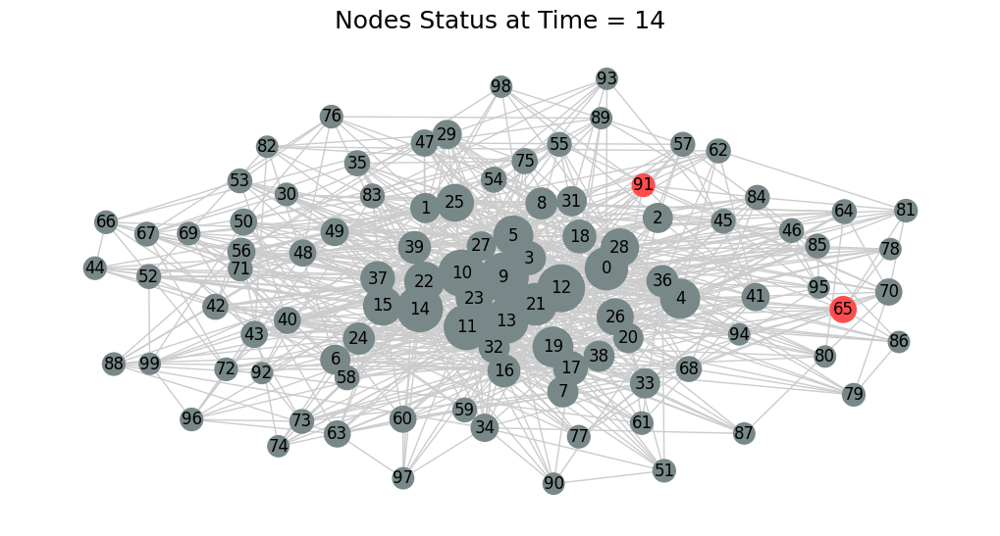

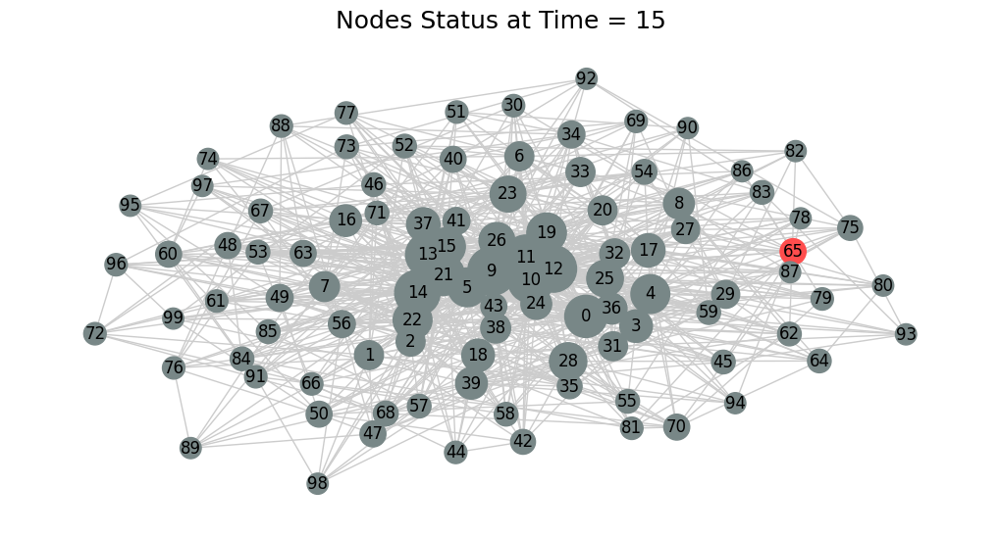

R0:  19.63
Peak cases:  88
Peak time period:  2
Total time periods:  16
# of susceptible never infected:  0


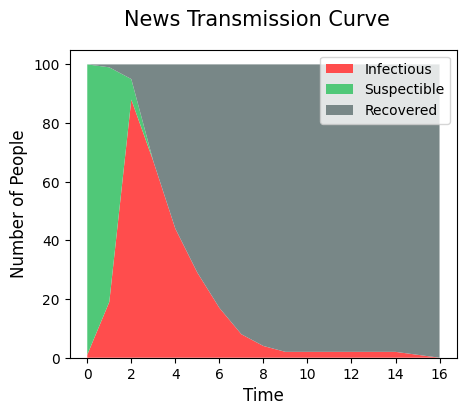

In [ ]:
for graph_type in graph_types_list:
    G = graph_type
    star_type = 0
    if graph_type==G_star:
        star_type = 1
    init_conditions()
    degree_dist = dict(G.degree)
    df_health_states_over_time = pd.DataFrame()
    df_health_states_over_time[0]=pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')
    color_state_map = {2: '#788787', 0: '#50C878', 1: '#FF4D4D'}
    num_periods, epi_curve_data, rec_curve_data, sup_curve_data = spread_virus(star_type)
    x = list(range(0, len(epi_curve_data)))
    generate_epidemic_graph()
    degrees = [val for (node, val) in G.degree()]
    avg_deg = G.number_of_edges()/n
    print_stats()

# **End of tutorial**